In [74]:
import numpy as np
import trimesh
import slam.io as sio
import nibabel as nib
from freesurfer_tools import transform_atlas, fsavg_vals_to_native
import matplotlib
matplotlib.use("Qt5Agg")
from matplotlib import cm, colors
import matplotlib.pylab as plt
import new_files
from sklearn.preprocessing import minmax_scale
from scipy.spatial.distance import euclidean

In [3]:
files = new_files.Files()

In [4]:
fsavg_sphere_paths = [
    "/home/mszul/git/DANC_multilayer_laminar/assets/lh.sphere.reg.gii",
    "/home/mszul/git/DANC_multilayer_laminar/assets/rh.sphere.reg.gii"
]
fsnat_sphere_paths = [
    "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/lh.sphere.reg.gii",
    "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/rh.sphere.reg.gii"
]
pial_path = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.gii"
pial_ds_path = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.ds.gii"
pial_ds_nodeep = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.ds.link_vector.nodeep.gii"
pial_ds_inflated = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.ds.inflated.nodeep.gii"
white_ds_nodeep = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/white.ds.link_vector.nodeep.gii"
thicc_l_paths = files.get_files("/home/mszul/git/DANC_multilayer_laminar/assets/big_brain_layer_thickness", "*.gii", strings=["hemi-L"], prefix="tpl-fsaverage")
thicc_r_paths = files.get_files("/home/mszul/git/DANC_multilayer_laminar/assets/big_brain_layer_thickness", "*.gii", strings=["hemi-R"], prefix="tpl-fsaverage")
# thicc_l_paths = files.get_files("/home/mszul/git/DANC_multilayer_laminar/assets/big_brain_layer_thickness", "*.gii", strings=["hemi-L"], prefix="tpl-bigbrain")
# thicc_r_paths = files.get_files("/home/mszul/git/DANC_multilayer_laminar/assets/big_brain_layer_thickness", "*.gii", strings=["hemi-R"], prefix="tpl-bigbrain")
thicc_lr_paths = list(zip(thicc_l_paths, thicc_r_paths))

In [6]:
values = [nib.load(i).agg_data() for i in thicc_lr_paths[0]]
xxx = fsavg_vals_to_native(values, fsavg_sphere_paths, fsnat_sphere_paths, pial_path, pial_ds_path, pial_ds_nodeep)

In [14]:
layers_fsaverage_values = {i+1: [nib.load(i).agg_data() for i in thicc_lr_paths[i]] for i in range(len(thicc_lr_paths))}
layers_fsnative_ds_values = {i: fsavg_vals_to_native(
    layers_fsaverage_values[i],
    fsavg_sphere_paths,
    fsnat_sphere_paths, 
    pial_path, 
    pial_ds_path, 
    pial_ds_nodeep
) for i in layers_fsaverage_values.keys()}

In [35]:
layers = np.array([layers_fsnative_ds_values[i] for i in layers_fsnative_ds_values.keys()])
overall_thickness = np.sum(layers, axis=0)
layers_prop_thickness = {i: np.divide(
    layers_fsnative_ds_values[i], 
    overall_thickness, 
    where=overall_thickness != 0
) for i in layers_fsnative_ds_values.keys()}

In [36]:
layers_prop_thickness

{1: array([0.13441235, 0.08211236, 0.09024148, ..., 0.11368235, 0.09225651,
        0.0844756 ], dtype=float32),
 2: array([0.09390735, 0.10098538, 0.10733496, ..., 0.10089654, 0.08360007,
        0.07688182], dtype=float32),
 3: array([0.2178302 , 0.24154131, 0.27489933, ..., 0.26923853, 0.22513229,
        0.20576851], dtype=float32),
 4: array([0.17673913, 0.09134307, 0.12291646, ..., 0.08005275, 0.09633908,
        0.09841546], dtype=float32),
 5: array([0.21304028, 0.2659741 , 0.22312187, ..., 0.21277751, 0.2123894 ,
        0.22490315], dtype=float32),
 6: array([0.16407073, 0.21804385, 0.18148589, ..., 0.22335237, 0.2902826 ,
        0.30955547], dtype=float32)}

In [68]:
cmap = cm.get_cmap("seismic")
inflated = sio.load_mesh(pial_ds_inflated)
modified_mesh_colors = [np.trunc(np.array(cmap(i))*255) for i in minmax_scale(overall_thickness)]
inflated.visual.vertex_colors = modified_mesh_colors
inflated.show(viewer="notebook")

In [66]:
pial_ds_loc = nib.load(pial_ds_nodeep).agg_data()[0]
white_ds_loc = nib.load(white_ds_nodeep).agg_data()[0]
distance_ROI = np.array([euclidean(pial_ds_loc[i], white_ds_loc[i]) for i in range(pial_ds_loc.shape[0])])

In [90]:
distance_ROI_mod = distance_ROI - np.mean(distance_ROI)

cmap = cm.get_cmap("seismic")
inflated = sio.load_mesh(pial_ds_inflated)
modified_mesh_colors = [np.trunc(np.array(cmap(i))*255) for i in minmax_scale(distance_ROI_mod)]
inflated.visual.vertex_colors = modified_mesh_colors
inflated.show(viewer="notebook")

In [72]:
distance_ROI.max()

10.63576889038086

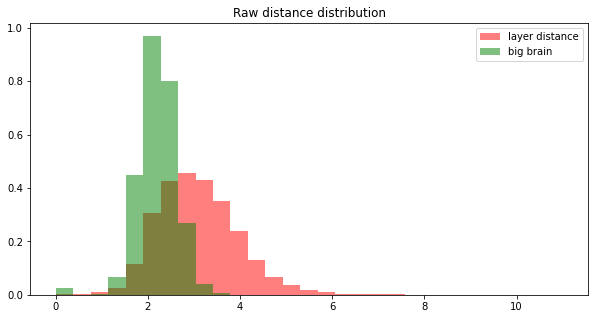

In [103]:
%matplotlib inline
f, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.hist(distance_ROI, bins=np.linspace(0,11,num=30), density=True, color="red", label="layer distance", alpha=0.5)
ax.hist(overall_thickness, bins=np.linspace(0,11,num=30), density=True, color="green", label="big brain", alpha=0.5)
ax.set_title("Raw distance distribution")
ax.legend();

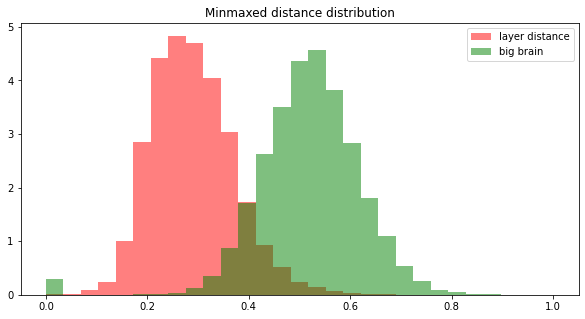

In [104]:
%matplotlib inline
f, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.hist(minmax_scale(distance_ROI), bins=np.linspace(0,1,num=30), density=True, color="red", label="layer distance", alpha=0.5)
ax.hist(minmax_scale(overall_thickness), bins=np.linspace(0,1,num=30), density=True, color="green", label="big brain", alpha=0.5)
ax.set_title("Minmaxed distance distribution")
ax.legend();

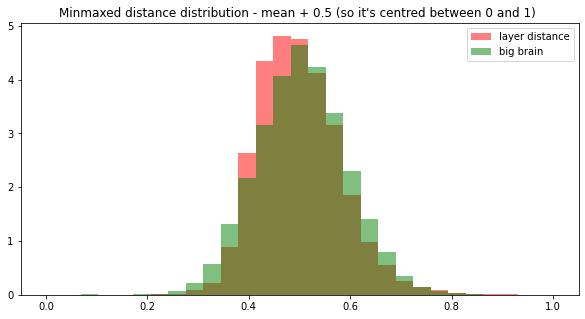

In [106]:
%matplotlib inline
mms_layer_dist = minmax_scale(distance_ROI)
mms_layer_dist = mms_layer_dist - np.mean(mms_layer_dist) + 0.5
mms_bb_thicc = minmax_scale(overall_thickness)
mms_bb_thicc = mms_bb_thicc - np.mean(mms_bb_thicc) + 0.5


f, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.hist(mms_layer_dist, bins=np.linspace(0,1,num=30), density=True, color="red", label="layer distance", alpha=0.5)
ax.hist(mms_bb_thicc, bins=np.linspace(0,1,num=30), density=True, color="green", label="big brain", alpha=0.5)
ax.set_title("Minmaxed distance distribution - mean + 0.5 (so it's centred between 0 and 1) ")
ax.legend();

In [100]:
cmap = cm.get_cmap("seismic")
inflated = sio.load_mesh(pial_ds_inflated)
modified_mesh_colors = [np.trunc(np.array(cmap(i))*255) for i in mms_bb_thicc]
inflated.visual.vertex_colors = modified_mesh_colors
inflated.show(viewer="notebook")

In [101]:
cmap = cm.get_cmap("seismic")
inflated = sio.load_mesh(pial_ds_inflated)
modified_mesh_colors = [np.trunc(np.array(cmap(i))*255) for i in mms_layer_dist]
inflated.visual.vertex_colors = modified_mesh_colors
inflated.show(viewer="notebook")

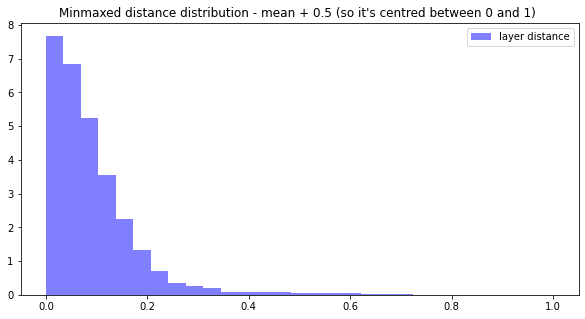

In [113]:
mms_diff = mms_layer_dist - mms_bb_thicc
mms_diff = mms_diff
f, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.hist(mms_diff, bins=np.linspace(0,1,num=30), density=True, color="blue", label="layer distance", alpha=0.5)
ax.set_title("Minmaxed distance distribution - mean + 0.5 (so it's centred between 0 and 1) ")
ax.legend();

In [114]:
cmap = cm.get_cmap("seismic")
inflated = sio.load_mesh(pial_ds_inflated)
modified_mesh_colors = [np.trunc(np.array(cmap(i))*255) for i in mms_diff]
inflated.visual.vertex_colors = modified_mesh_colors
inflated.show(viewer="notebook")